In [65]:
import pandas as pd
import numpy as np
import hdbscan
import matplotlib.pyplot as plt
from matplotlib import cm
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import power_transform

In [128]:
def plot_clusters(labels, projection):
    clust_label_df = pd.DataFrame({
                                    'label': labels,
                                    'x': projection[:,0],
                                    'y':projection[:,1]
                                })
    
    fig, axs = plt.subplots(figsize = (12,8), ncols = 2, gridspec_kw = {'width_ratios': (4,2)}, dpi = 600)

    palette = ['grey', *cm.get_cmap('viridis', labels.max()+1).colors]

    for i in range(-1, labels.max()+1):
        label_frame = clust_label_df.loc[clust_label_df['label'] == i]
        axs[0].scatter(label_frame.x, label_frame.y, color = palette[i+1], alpha = 0.3)
    
    bar_y = np.arange(labels.max()+2)
    cluster_sizes = [len([x for x in labels if x == i]) for i in range(-1, labels.max()+1)]
    axs[1].set_xscale('log')
    axs[1].set_xlim((1, max(cluster_sizes)))
    axs[1].set_yticks([],[])
    
    for i in bar_y:
        axs[1].text(3, bar_y[i], cluster_sizes[i], weight = 'bold')
    
    axs[1].barh(bar_y, cluster_sizes, color = palette)
    axs[1].set_xlabel('Genes in cluster')
    plt.tight_layout()
 

I can import the GDSC1 data directly from the data section of the website.

In [3]:
rma_expr = pd.read_csv("https://www.cancerrxgene.org/gdsc1000/GDSC1000_WebResources//Data/preprocessed/Cell_line_RMA_proc_basalExp.txt.zip", sep = "\t")
rma_expr = rma_expr.drop('GENE_title', axis = 1)
rma_expr= rma_expr.set_index('GENE_SYMBOLS')
rma_expr

,DATA.906826,DATA.687983,DATA.910927,DATA.1240138,DATA.1240139,DATA.906792,DATA.910688,DATA.1240135,DATA.1290812,DATA.907045,...,DATA.753584,DATA.907044,DATA.998184,DATA.908145,DATA.1659787,DATA.1298157,DATA.1480372,DATA.1298533,DATA.930299,DATA.905954.1
GENE_SYMBOLS,,,,,,,,,,,,,,,,,,,,,
TSPAN6,7.632023,7.548671,8.712338,7.797142,7.729268,7.074533,3.285198,6.961606,5.943046,3.455951,...,7.105637,3.236503,3.038892,8.373223,6.932178,8.441628,8.422922,8.089255,3.112333,7.153127
TNMD,2.964585,2.777716,2.643508,2.817923,2.957739,2.889677,2.828203,2.874751,2.686874,3.290184,...,2.798847,2.745137,2.976406,2.852552,2.622630,2.639276,2.879890,2.521169,2.870468,2.834285
DPM1,10.379553,11.807341,9.880733,9.883471,10.418840,9.773987,10.264385,10.205931,10.299757,11.570155,...,10.486486,10.442951,10.311962,10.454830,10.418475,11.463742,10.557777,10.792750,9.873902,10.788218
SCYL3,3.614794,4.066887,3.956230,4.063701,4.341500,4.270903,5.968168,3.715033,3.848112,5.560883,...,3.696835,4.624013,4.348524,3.858121,3.947561,4.425849,3.550390,4.443337,4.266828,4.100493
C1orf112,3.380681,3.732485,3.236620,3.558414,3.840373,3.815055,3.011867,3.268449,3.352835,3.571228,...,3.726833,3.947744,3.806584,3.196988,3.814831,4.384732,4.247189,3.071359,3.230197,3.435795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,2.852537,2.776771,2.685307,3.436412,2.951270,3.233383,3.810246,2.792116,2.641117,3.124607,...,2.699663,5.190438,3.253381,3.000088,2.846830,2.959009,2.974475,2.903894,2.857956,3.033662
POLRMTP1,3.130696,3.260982,3.176239,3.074432,3.213545,3.382112,3.200106,2.829053,3.158745,3.173933,...,2.773728,2.988250,3.514337,3.254306,3.139208,3.007502,3.088841,2.847505,2.832840,2.817057
UBL5P2,9.986616,9.002814,9.113243,9.958284,9.938978,8.714820,9.396484,9.779745,9.477582,9.518999,...,9.593772,9.506062,9.945730,9.890244,10.018968,9.332193,10.742651,8.544696,9.900550,9.071943


So each column of this dataset is the expression data for a cell line, and each row is a gene. I've confirmed that each number (e.g. 906826 for `DATA.906826`) is a line (e.g. CAL-120). I will eventually need to find a way to map these, but it's not necessary yet.

There are 17737 genes! Yikes.

I'll want to cluster genes by their cell-lines. A good candidate for this might be HDBScan, which works nicely on high dimensional data (this is 1020-dimensional) and odd-shaped clusters.

Before performing the clustering, it's probably a good idea to visualise the genes' distribution. I'll use a t-SNE to reduce the dimensions.

In [4]:
tsne = TSNE(n_components = 2)

In [5]:
gene_embed = tsne.fit_transform(rma_expr)

C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


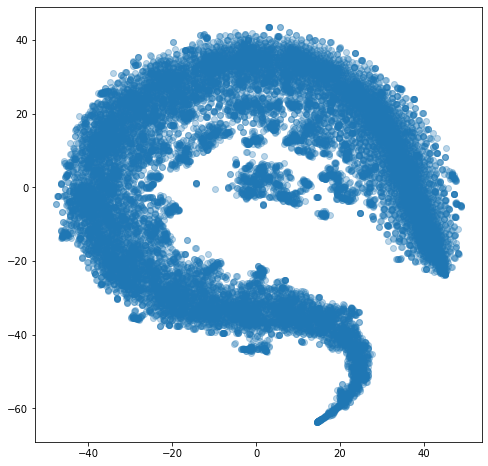

In [6]:
fig, ax = plt.subplots(figsize = (8,8))
ax.scatter(gene_embed[:,0], gene_embed[:,1], alpha = 0.3)

Well that's quite pretty! Possibly not too promising for getting something useful for clustering, but very, very pretty. Let's have a go at clustering.

In [31]:
clusterer = hdbscan.HDBSCAN(metric = 'manhattan')
clusterer.fit(rma_expr)

HDBSCAN(metric='manhattan')

In [32]:
clusterer.labels_.max()

7

In [33]:
clust_label_df = pd.DataFrame({
    'label': clusterer.labels_,
    'x': gene_embed[:,0],
    'y':gene_embed[:,1]
})

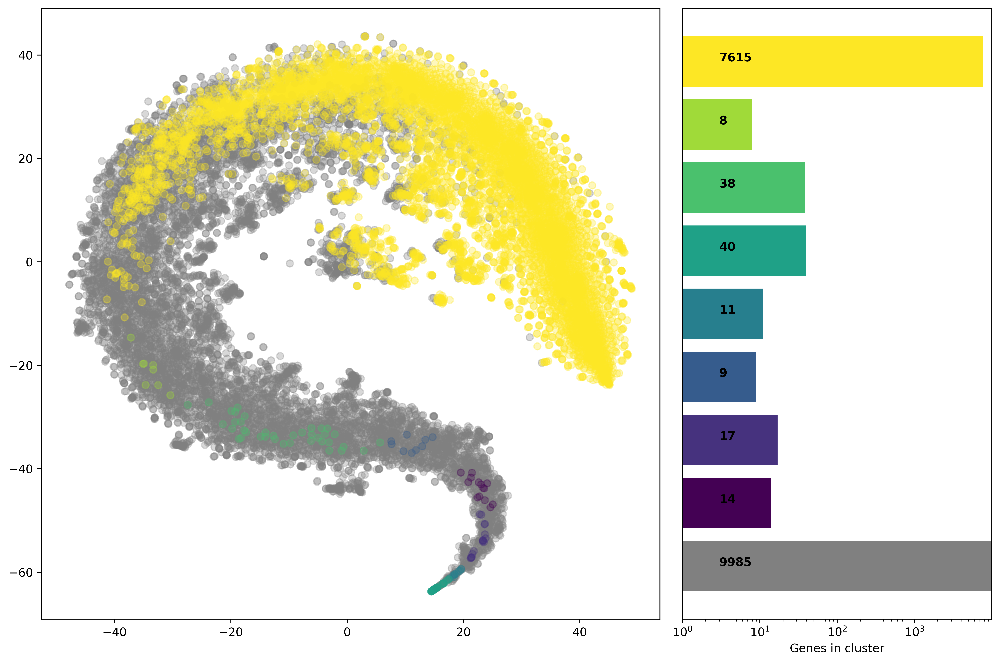

In [129]:
plot_clusters(clusterer.labels_, gene_embed)
plt.savefig('20220614 clusters no norm.png')

In [35]:
for i in range(-1,8):
    print(len([x for x in clusterer.labels_ if x == i]))

9985
14
17
9
11
40
38
8
7615


In [133]:
pd.DataFrame({
    'Gene': rma_expr.index,
    'Cluster': clusterer.labels_
}).to_csv('2022')

,Gene,Cluster
0,TSPAN6,-1
1,TNMD,7
2,DPM1,-1
3,SCYL3,-1
4,C1orf112,7
...,...,...
17732,NaN,-1
17733,POLRMTP1,7
17734,UBL5P2,-1
17735,TBC1D3P5,7


In [44]:
rma_expr.iloc[np.where(np.array(clusterer.labels_) == 0)]

,DATA.906826,DATA.687983,DATA.910927,DATA.1240138,DATA.1240139,DATA.906792,DATA.910688,DATA.1240135,DATA.1290812,DATA.907045,...,DATA.753584,DATA.907044,DATA.998184,DATA.908145,DATA.1659787,DATA.1298157,DATA.1480372,DATA.1298533,DATA.930299,DATA.905954.1
GENE_SYMBOLS,,,,,,,,,,,,,,,,,,,,,
ZNF207,9.149245,9.598530,9.529239,9.569737,9.039720,9.338259,9.390774,9.387216,9.241169,8.984273,...,9.364188,9.924896,9.791887,9.336494,9.229675,9.099492,8.953671,9.162659,9.027736,8.781803
RPL18,9.259280,8.905354,8.892454,8.702678,9.048737,8.865378,9.202292,8.913216,9.214355,8.783834,...,8.852625,9.297845,9.065611,8.777511,9.152780,8.864735,8.688588,9.173508,8.803642,9.010596
DAZAP1,8.907077,8.543832,8.704225,8.875372,8.753537,8.417100,8.736287,8.668262,8.532211,8.802285,...,8.966488,9.404492,9.009522,8.289871,9.147478,9.071671,8.902358,8.950401,8.366367,8.192479
NDUFA8,9.451878,9.223173,9.040262,9.331584,9.816536,9.362101,8.926020,8.409499,8.961600,9.925954,...,9.361001,9.130707,9.379157,9.164346,9.872406,9.344870,9.409293,8.553329,9.134611,8.970756
KHDRBS1,9.333762,9.796719,9.488775,9.137610,9.604341,8.885684,9.461784,9.177097,9.245956,9.274706,...,9.382517,10.093995,9.990083,9.042866,9.586505,9.264751,9.206946,8.755240,8.677579,8.842731
HNRNPR,9.249516,10.099268,9.528582,8.701567,8.820962,9.160233,8.585390,9.152517,8.889113,8.665435,...,9.595550,9.614478,9.914962,9.129271,9.426897,9.254860,9.076327,8.683015,8.591677,9.179880
COX4I1,9.241445,9.237713,8.974834,9.033586,9.335509,9.666359,9.691215,9.557738,8.582465,8.576538,...,8.526318,9.116937,9.292374,9.064512,9.278732,9.772807,8.842603,9.032717,10.058278,8.645415
IMMT,9.353579,9.694776,9.492804,9.211984,9.706641,9.819640,8.577380,9.142301,9.207106,8.902503,...,8.377450,9.573851,8.989231,9.126977,9.712430,9.588423,9.244603,8.884331,9.219726,9.389195
RAN,9.006791,9.093112,9.140899,8.989725,8.735195,8.950046,9.162814,9.533229,9.217307,8.896219,...,9.121244,9.418952,9.358365,8.569514,9.099175,9.120019,9.120249,8.879961,9.134506,9.051287


In [ ]:
rma_expr_normalised.apply(lambda x: )

C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['float', 'str']. An error will be raised in 1.2.
  warnings.warn(


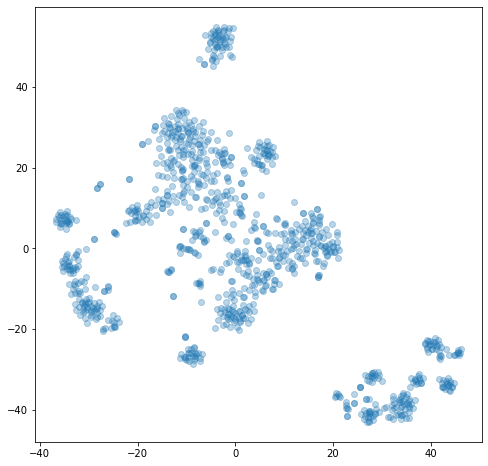

In [45]:
tsne2 = TSNE(n_components = 2)
cell_embed = tsne.fit_transform(rma_expr.T)

fig, ax = plt.subplots(figsize = (8,8))
ax.scatter(cell_embed[:,0], cell_embed[:,1], alpha = 0.3)

In [47]:
cell_clusterer = hdbscan.HDBSCAN(metric = 'manhattan')
cell_clusterer.fit(rma_expr.T)

HDBSCAN(metric='manhattan')

In [48]:
cell_clust_label_df = pd.DataFrame({
    'label': cell_clusterer.labels_,
    'x': cell_embed[:,0],
    'y': cell_embed[:,1]
})

In [49]:
cell_clusterer.labels_.max()

2

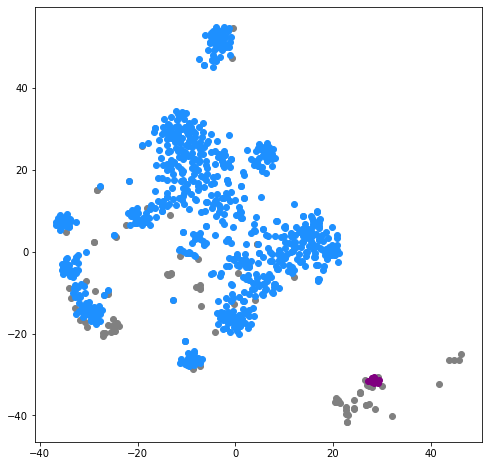

In [50]:
fig, ax = plt.subplots(figsize = (8,8))

palette = ['grey', 'dodgerblue', 'purple', 'firebrick', 'darkorange', 'gold', 'olivedrab', 'forestgreen', 'c']

for i in range(-1,2):
    label_frame = cell_clust_label_df.loc[cell_clust_label_df['label'] == i]
    ax.scatter(label_frame.x, label_frame.y, color = palette[i+1])

In [51]:
tsne_cell_clusterer = hdbscan.HDBSCAN(metric = 'manhattan')
tsne_cell_clusterer.fit(cell_embed)
tsne_cell_clust_label_df = pd.DataFrame({
    'label': tsne_cell_clusterer.labels_,
    'x': cell_embed[:,0],
    'y': cell_embed[:,1]
})

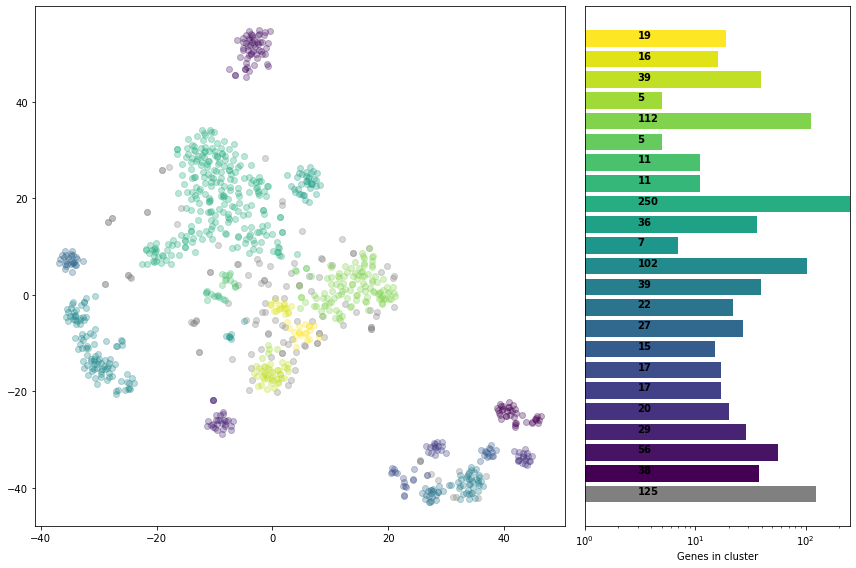

In [127]:
plot_clusters(tsne_cell_clusterer.labels_, cell_embed)

In [36]:
rma_expr_normalised = rma_expr.copy()

In [82]:
power_transform(np.array(rma_expr_normalised['DATA.906826']).reshape(-1,1), method = 'box-cox')

array([[ 1.30267616],
       [-1.04393387],
       [ 1.6845223 ],
       ...,
       [ 1.64306748],
       [-0.90522956],
       [ 1.23335471]])

In [84]:
arr_rma_expr_norm = power_transform(rma_expr_normalised)

In [85]:
arr_rma_expr_norm.shape

(17737, 1018)

In [87]:
gene_embed_norm = tsne.fit_transform(arr_rma_expr_norm)

C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mbzjim\Anaconda3\envs\bioinf-expression\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


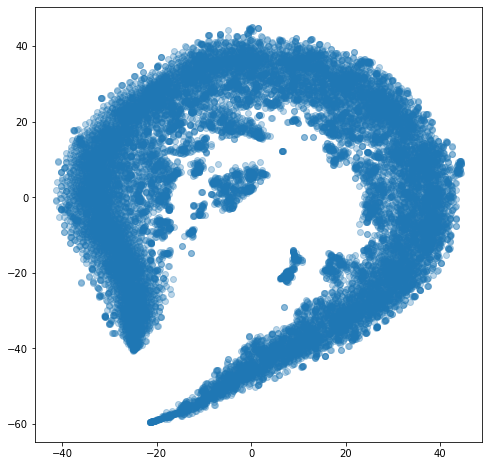

In [88]:
fig, ax = plt.subplots(figsize = (8,8))
ax.scatter(gene_embed_norm[:,0], gene_embed_norm[:,1], alpha = 0.3)

In [89]:
clusterer_norm = hdbscan.HDBSCAN(metric = 'manhattan')
clusterer_norm.fit(arr_rma_expr_norm)

HDBSCAN(metric='manhattan')

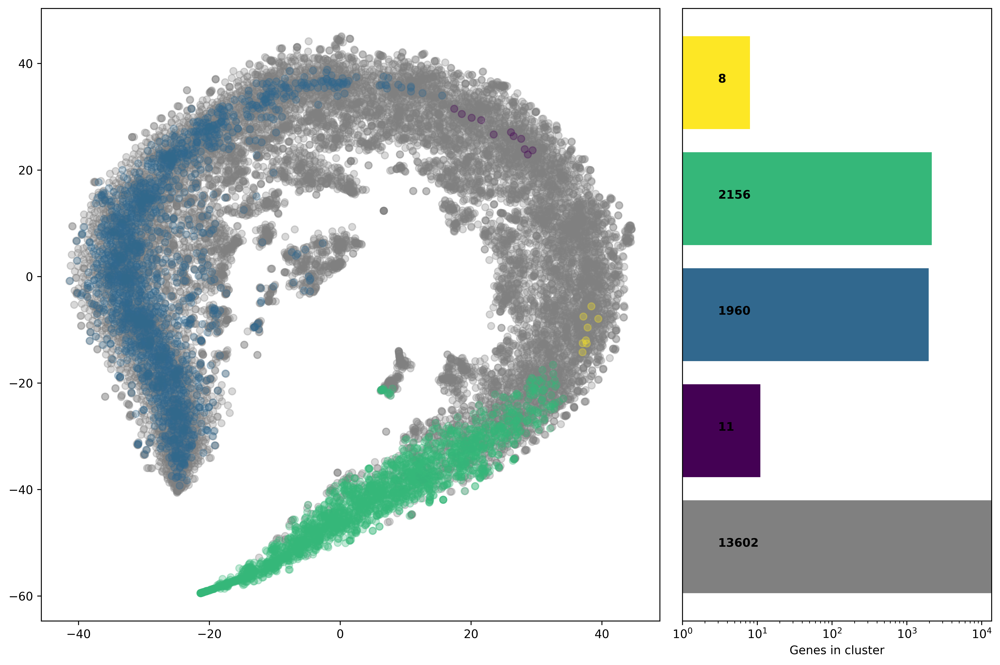

In [130]:
plot_clusters(clusterer_norm.labels_, gene_embed_norm)
plt.savefig('20220614 clusters power norm.png')

@article{mcinnes2017hdbscan,
  title={hdbscan: Hierarchical density based clustering},
  author={McInnes, Leland and Healy, John and Astels, Steve},
  journal={The Journal of Open Source Software},
  volume={2},
  number={11},
  pages={205},
  year={2017}
}